In [340]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import time
from skimage import morphology,data,color
import cmath

In [110]:
def get_cut_point(name):
    plt.rcParams['figure.figsize'] = (30, 20)
    g_img = cv2.imread(name,0)
    g_img = cv2.resize(g_img, (700, 1000), interpolation=cv2.INTER_CUBIC)
    t_img = cv2.adaptiveThreshold(g_img,255,cv2.ADAPTIVE_THRESH_MEAN_C ,cv2.THRESH_BINARY_INV,51,30)
#     t_img = 255-t_img

    kernel = np.ones((10,10),np.uint8)
    close_img = cv2.morphologyEx(t_img, cv2.MORPH_CLOSE, kernel)
    kernel = np.ones((5,10),np.uint8)
    open_img = cv2.morphologyEx(close_img, cv2.MORPH_OPEN, kernel)
    kernel = np.ones((100,30),np.uint8)
    open_img = cv2.morphologyEx(open_img, cv2.MORPH_CLOSE, kernel)
    
    img_x = open_img.mean(axis=0)
    arr = range(len(img_x))
    plt.bar(arr,img_x,facecolor='b',edgecolor='r')
    plt.show()
    
    top_area = np.where(img_x>50)[0]
#     print(top_area)
    diff_top = top_area[1:]-top_area[:-1]
    
    diff_index = np.where(diff_top>1)[0]
    if len(diff_index)!=0:
        bottom_index = top_area[diff_index[0]]+int(diff_top[diff_index[0]]/3)
    else:
        bottom_index=0
    
#     img_mid = img_x[int(len(img_x)/4):-int(len(img_x)/4)]
#     cut_point = np.where(img_mid == max(img_mid))[0][0]+int(len(img_x)/4)
    
#     plt.imshow(close_img)
#     plt.show()
#     plt.imshow(open_img)
#     plt.show()
#     plt.imshow(open_img)
#     plt.show()
    
    left_img = t_img[:,:bottom_index]
    right_img = t_img[:,bottom_index:]
    return left_img,right_img,bottom_index

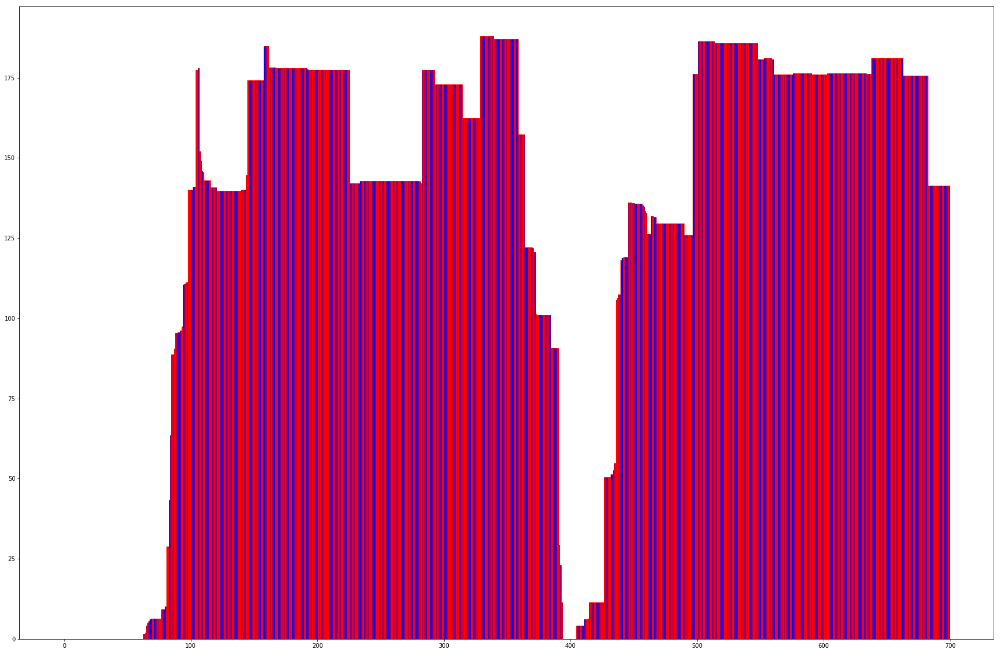

402


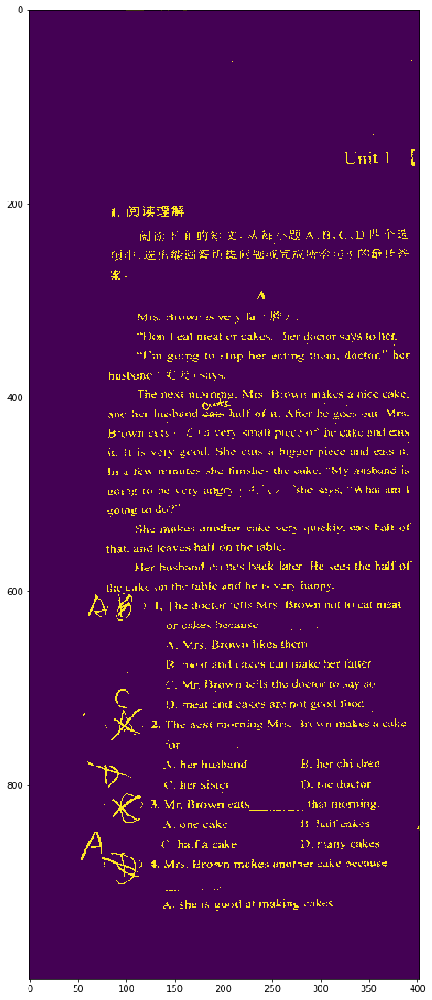

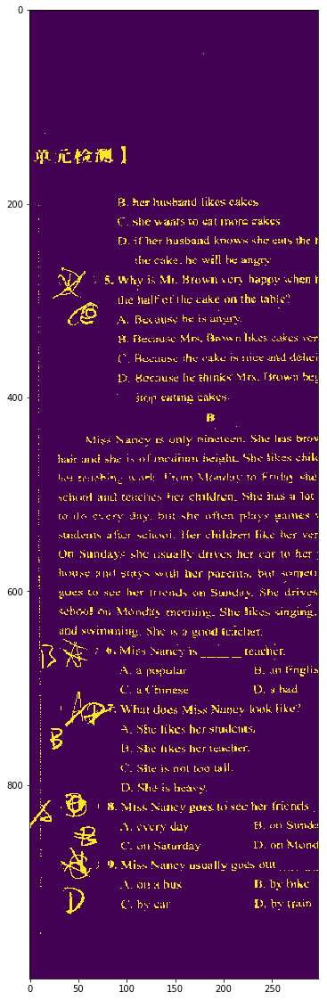

In [112]:
all_name = ["test","test1","test2","test3"]
all_name = ["test"]
for i in range(len(all_name)):
    left_img,right_img,cut_point = get_cut_point("title/"+all_name[i]+".jpg")
    print(cut_point)
    plt.imshow(left_img)
    plt.show()
    plt.imshow(right_img)
    plt.show()

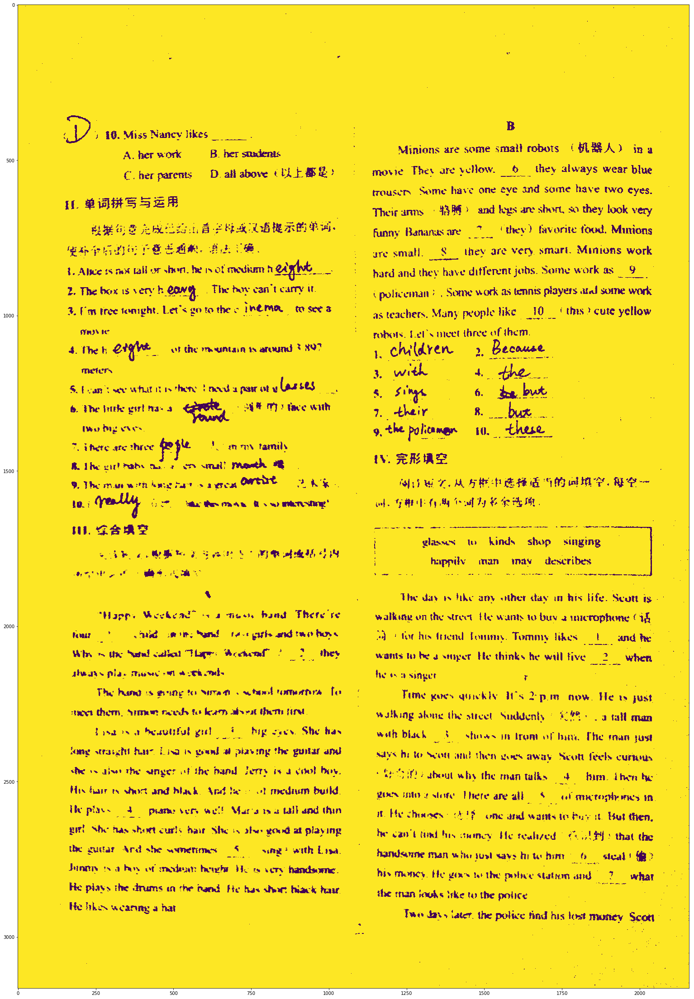

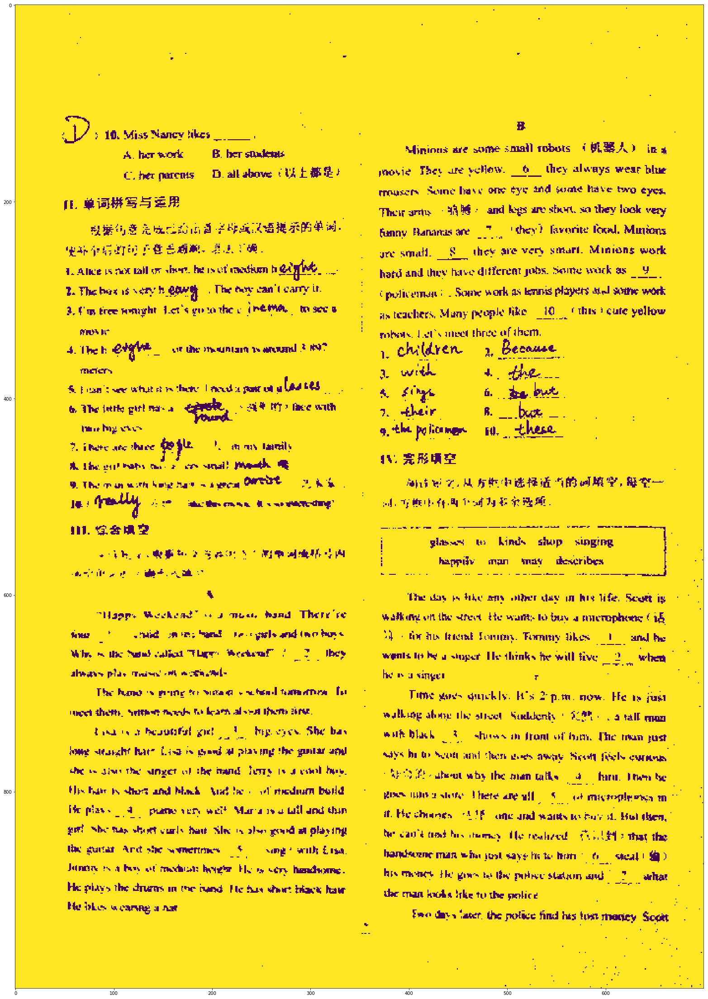

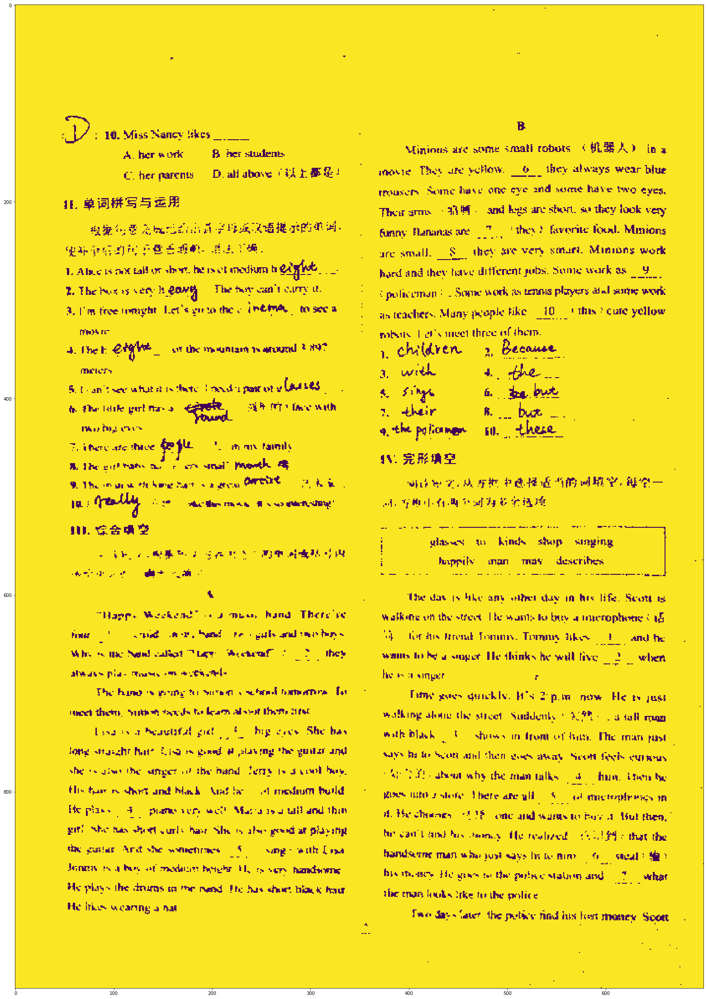

In [205]:
plt.rcParams['figure.figsize'] = (80, 40)
g_img = cv2.imread("title/test1.jpg",0)
# plt.imshow(g_img)
# plt.show()
# g_img = cv2.resize(g_img, (700, 1000), interpolation=cv2.INTER_CUBIC)
# plt.imshow(g_img)
# plt.show()
t_img = cv2.adaptiveThreshold(g_img,255,cv2.ADAPTIVE_THRESH_MEAN_C ,cv2.THRESH_BINARY,301,20)
# t_img=255-t_img
# plt.imshow(t_img)
# plt.show()

# kernel = np.ones((2,2),np.uint8)#5,5   MORPH_TOPHAT   MORPH_BLACKHAT
# di_img = cv2.dilate(t_img,kernel,iterations = 1)
# ba_img = cv2.morphologyEx(t_img, cv2.MORPH_BLACKHAT, kernel)

# plt.imshow(di_img-ba_img)
# plt.show()
plt.imshow(t_img)
plt.show()
t_img = cv2.resize(t_img, (700, 1000), interpolation=cv2.INTER_LINEAR)

# t_img=255-t_img
t_img = cv2.adaptiveThreshold(t_img,255,cv2.ADAPTIVE_THRESH_MEAN_C ,cv2.THRESH_BINARY,51,20)
plt.imshow(t_img)
plt.show()

t_img2 = cv2.resize(g_img, (700, 1000), interpolation=cv2.INTER_LINEAR)

# t_img=255-t_img
t_img2 = cv2.adaptiveThreshold(t_img2,255,cv2.ADAPTIVE_THRESH_MEAN_C ,cv2.THRESH_BINARY,51,20)
end_img=t_img+t_img2
end_img[end_img>255]=255
plt.imshow(end_img)
plt.show()

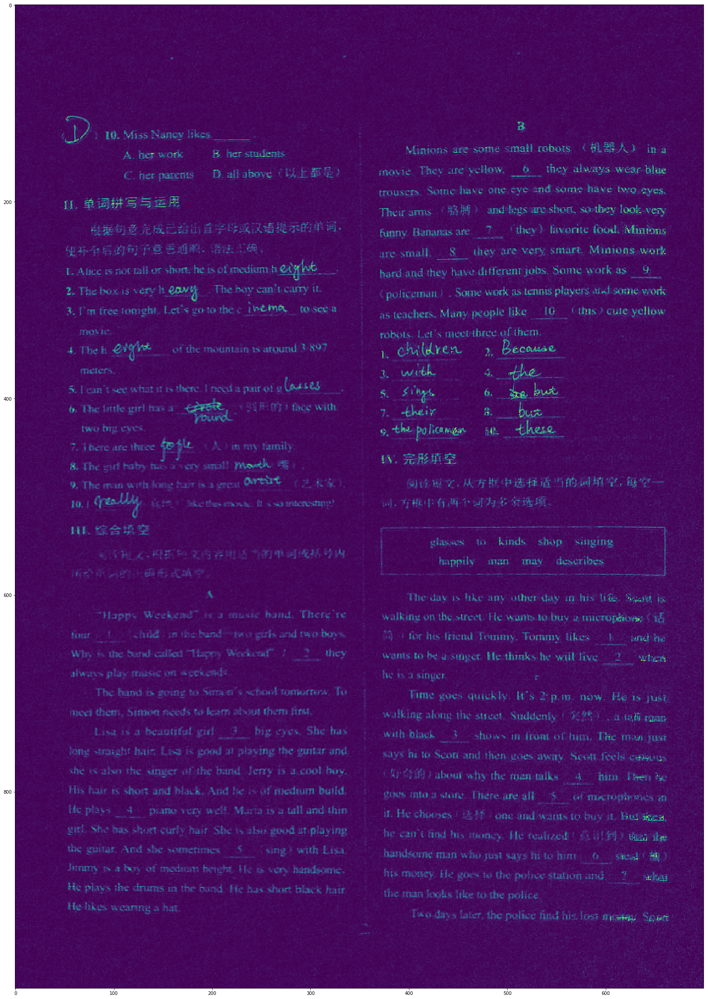

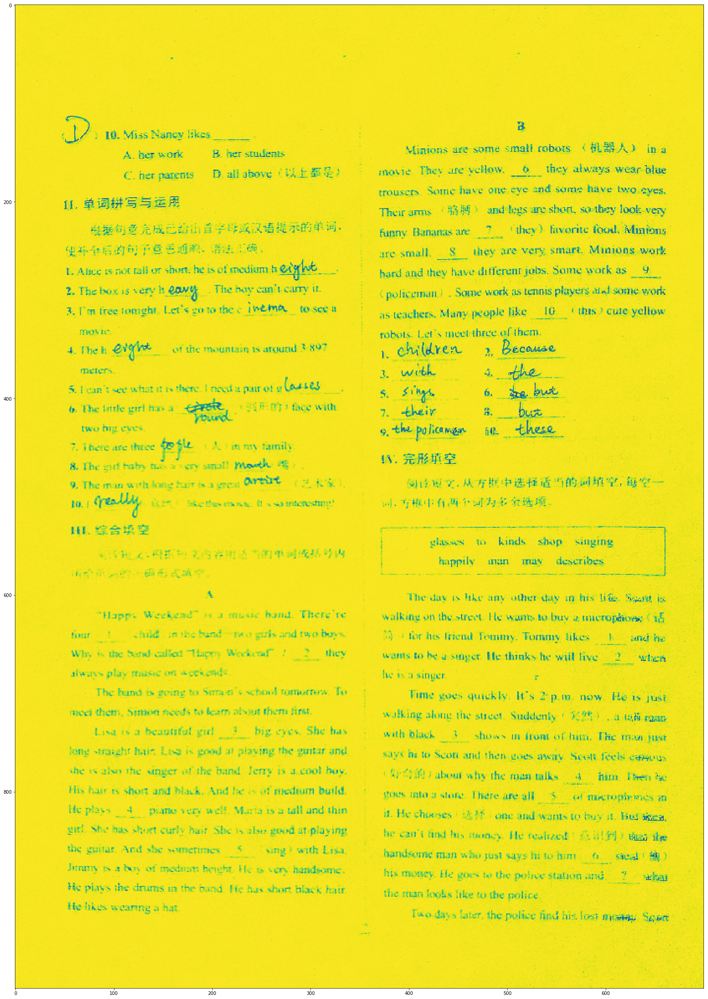

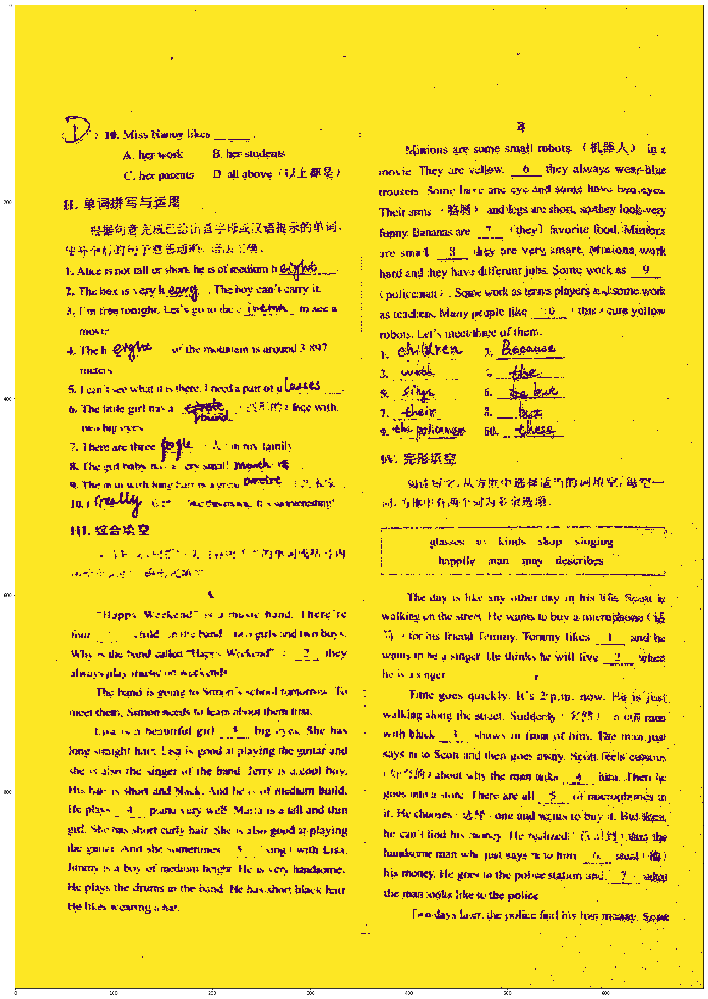

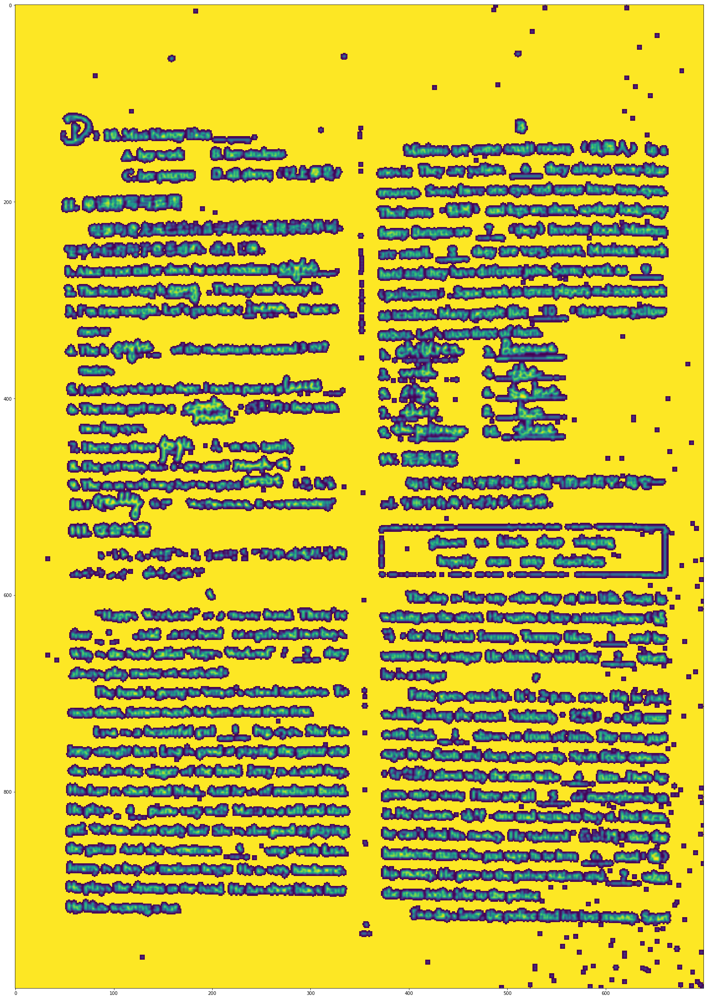

uint8
uint8


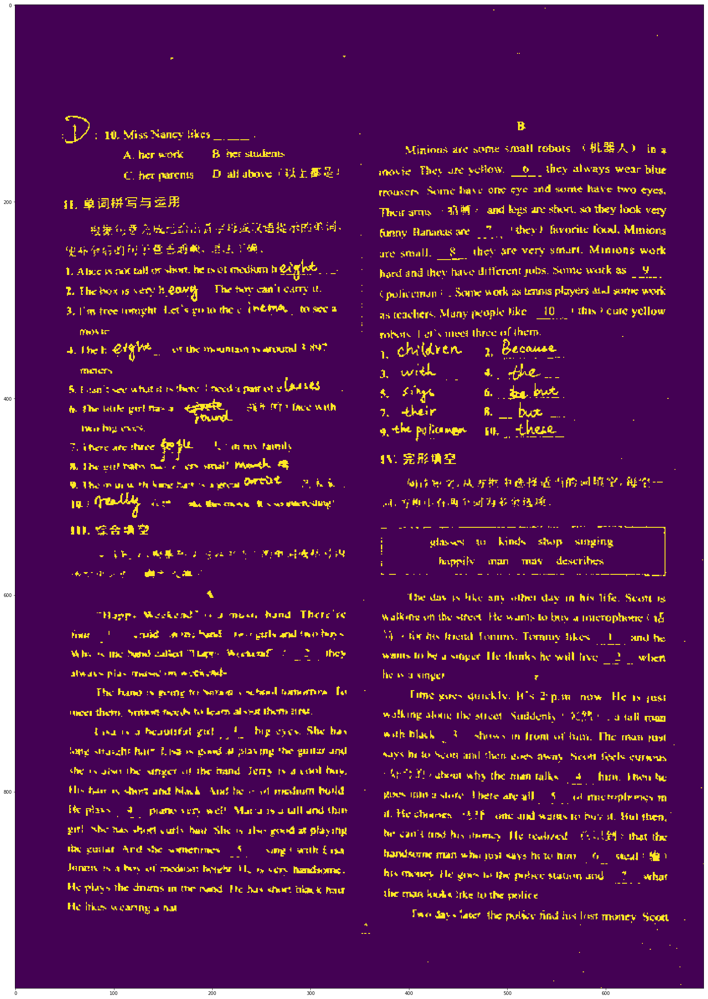

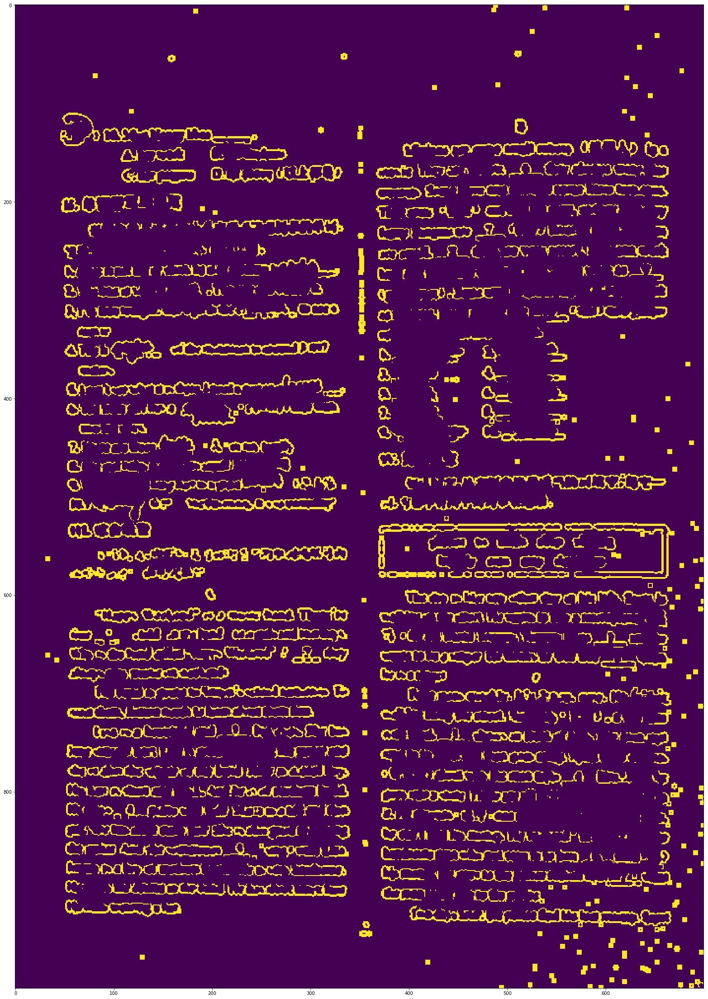

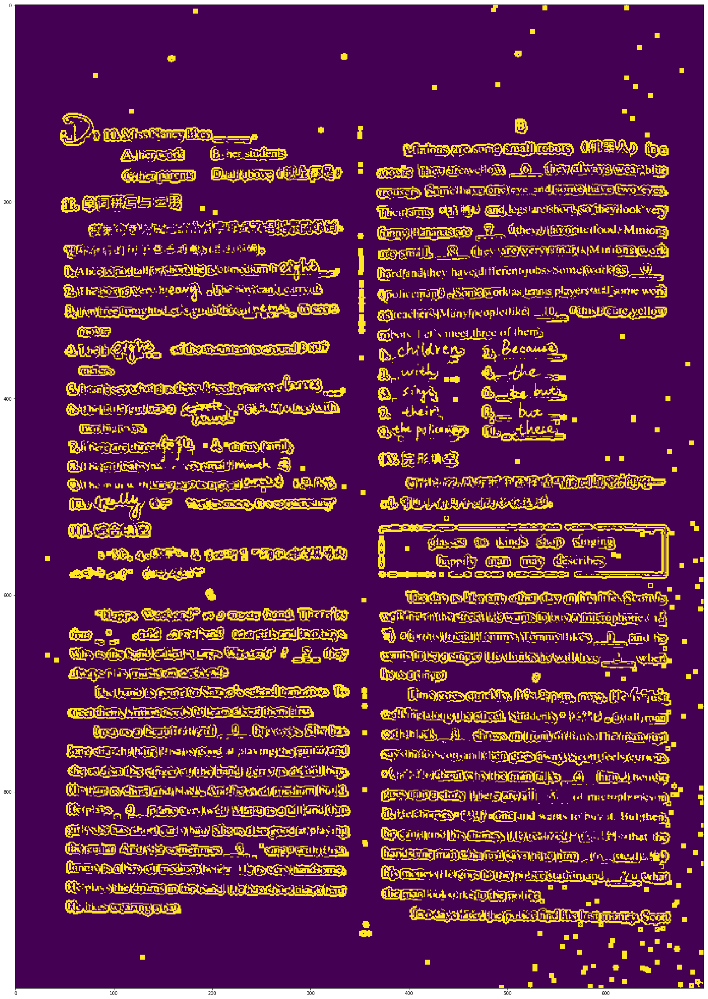

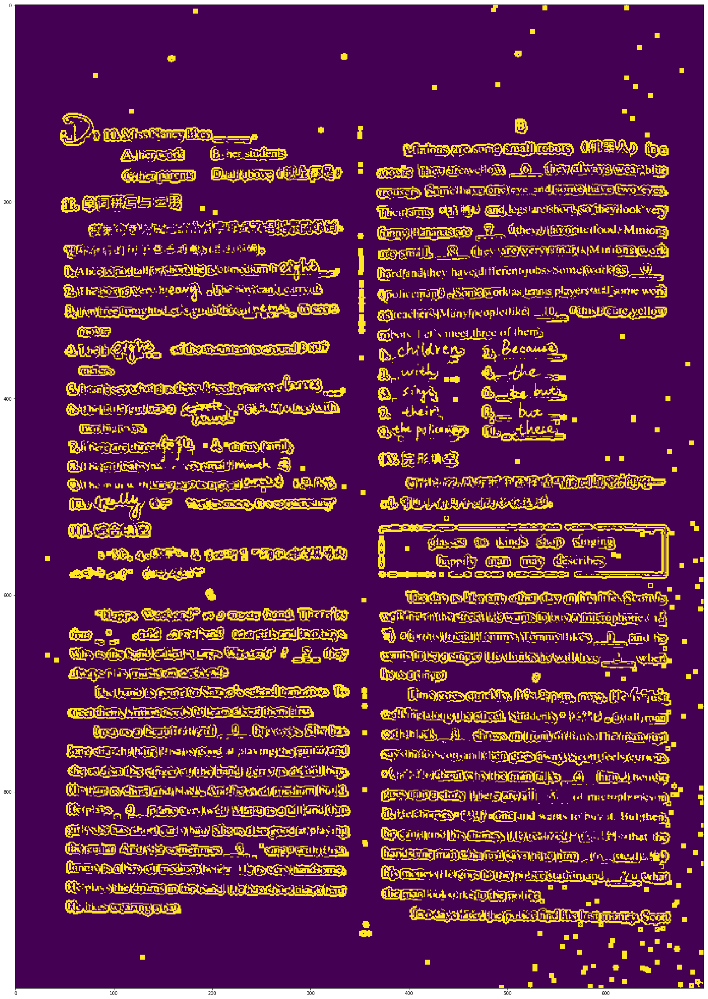

In [458]:
plt.rcParams['figure.figsize'] = (80, 40)
g_img = cv2.imread("title/test1.jpg",0)#
g_img = cv2.resize(g_img, (700, 1000), interpolation=cv2.INTER_LINEAR)

# plt.imshow(g_img)
# plt.show()


kernel_size = (9, 9)
sigma = 1
# plt.imshow(g_img)
# plt.show()
img = cv2.GaussianBlur(g_img, kernel_size, sigma)
# img=cv2.medianBlur(g_img,5)

r_img = g_img+g_img-img
# plt.imshow(r_img)
# plt.show()
kernel = np.ones((6,6),np.uint8)
r_img = cv2.morphologyEx(r_img, cv2.MORPH_BLACKHAT, kernel)
plt.imshow(r_img)
plt.show()
r_img=255-r_img
r_img = cv2.fastNlMeansDenoising(r_img,3,7,1)

plt.imshow(r_img)
plt.show()
index = np.where(r_img<230)
new_img = np.ones((1000,700))*255
new_img = new_img.astype(np.uint8)
new_img[index]=0
plt.imshow(new_img)
plt.show()

kernel_size = (9, 9)
sigma = 1
# plt.imshow(g_img)
# plt.show()
img = cv2.GaussianBlur(new_img, kernel_size, sigma)
# img=cv2.medianBlur(g_img,5)

r_img = new_img+new_img-img
plt.imshow(r_img)
plt.show()
r_img = np.round(r_img)
r_img[r_img<0]=0
r_img[r_img>255]=255
print(r_img.dtype)
print(g_img.dtype)
# r_img[r_img<230]=0
# plt.imshow(r_img)
# plt.show()
# r_img[r_img<100]=255
# r_img[r_img>150]=255
# r_t_img = cv2.adaptiveThreshold(r_img,100,cv2.ADAPTIVE_THRESH_MEAN_C ,cv2.THRESH_BINARY,31,100)

# print(r_img[180:200,110:120])
# plt.imshow(g_img+r_img)
# plt.show()
# g_img = cv2.resize(g_img, (700, 1000), interpolation=cv2.INTER_LINEAR)
# r_img = cv2.resize(r_img, (700, 1000), interpolation=cv2.INTER_LINEAR)
g_t_img = cv2.adaptiveThreshold(g_img,255,cv2.ADAPTIVE_THRESH_MEAN_C ,cv2.THRESH_BINARY,31,20)
r_t_img = cv2.adaptiveThreshold(r_img,255,cv2.ADAPTIVE_THRESH_MEAN_C ,cv2.THRESH_BINARY,31,150)

g_t_img=255-g_t_img
r_t_img=255-r_t_img

plt.imshow(g_t_img)
plt.show()
plt.imshow(r_t_img)
plt.show()

# resize_img = cv2.resize(r_img, (700, 1000), interpolation=cv2.INTER_LINEAR)

end_img = r_t_img+g_t_img
end_img[end_img>250]=255

plt.imshow(end_img)
plt.show()
end_img = end_img+g_t_img
end_img[end_img>250]=255
plt.imshow(end_img)
plt.show()

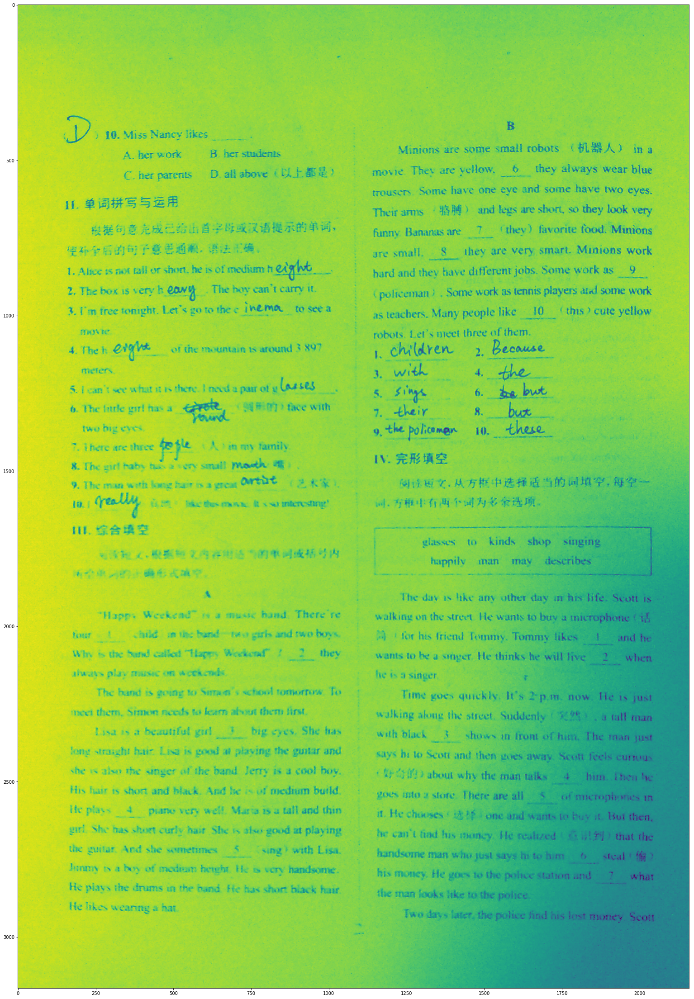

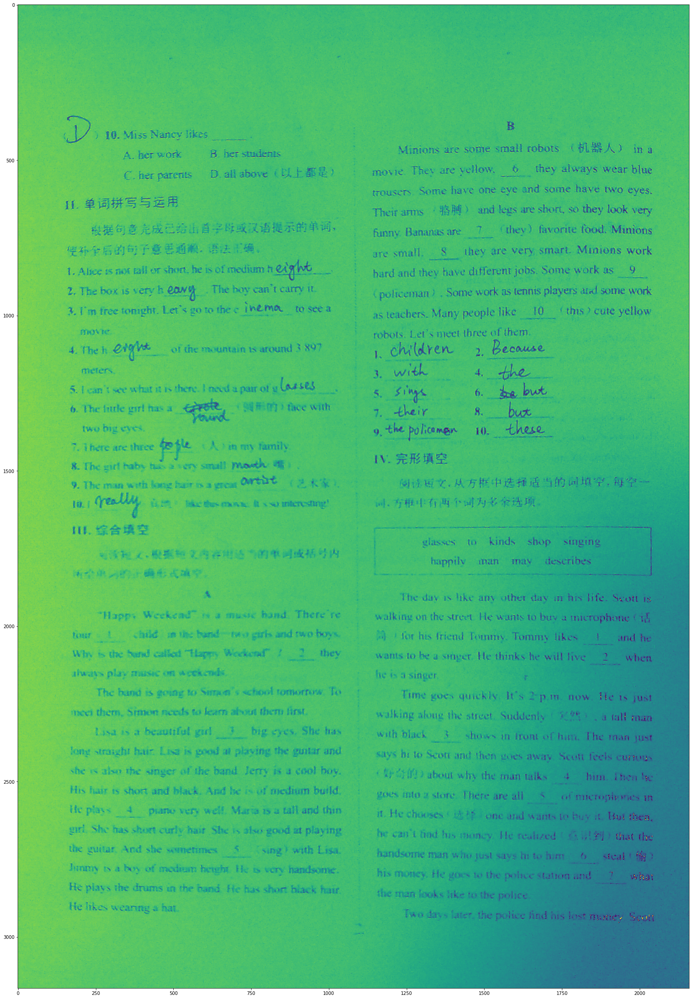

In [456]:
plt.rcParams['figure.figsize'] = (80, 40)
g_img = cv2.imread("title/test1.jpg",0)
kernel_size = (5, 5);
sigma = 1.5;
plt.imshow(g_img)
plt.show()
img = cv2.GaussianBlur(g_img, kernel_size, sigma);
# plt.imshow(img)
# plt.show()

r_img = g_img+g_img-img
plt.imshow(r_img)
plt.show()